In [1]:
# Import
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Chemins des cascades (inclus avec opencv)
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')
smile_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_smile.xml')

In [13]:
def detecter_visages(image_path):
    """Détecte les visages dans une image"""
    
    img = cv2.imread(image_path) # Charger l'image
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # convertir l'image en niveau de gris (gris)
    
    # Charger le classificateur
    face_cascade = cv2.CascadeClassifier(
        cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'
    )
    
    # Détecter les visages
    faces = face_cascade.detectMultiScale(
        gray,              # L'image en niveaux de gris sur laquelle on cherche des visages
        scaleFactor=1.5,   # Facteur de réduction : à chaque étape, l'image est réduite de 30% pour détecter des visages de différentes tailles
        minNeighbors=1,    # Nombre minimum de rectangles voisins requis pour valider une détection (filtre le bruit)
        minSize=(10, 10)   # Taille minimale de la fenêtre détectée (évite de détecter des zones trop petites comme des faux positifs)
    )

    
    print(f"Nombre de visages détectés: {len(faces)}") # Afficher le nombre d'images
    
    # Dessiner les rectangles
    img_result = img.copy()  # On crée une copie de l'image d'origine pour dessiner dessus sans la modifier

    for (x, y, w, h) in faces:
        # Pour chaque visage détecté (x,y) = coord. coin supérieur gauche, w,h = largeur/hauteur

        cv2.rectangle(img_result, (x, y), (x+w, y+h), (0, 255, 0), 3)# On dessine un rectangle vert autour du visage

        cv2.putText(img_result, f'#{len(faces)}', (x, y-10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)# On écrit le nombre total de visages détectés (len(faces)) au-dessus du rectangle
        # (x, y-10) place le texte juste au-dessus du rectangle

    
    # Affichage
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original')
    axes[0].axis('off')
    
    axes[1].imshow(cv2.cvtColor(img_result, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f'Visages détectés: {len(faces)}')
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return faces, img_result



Nombre de visages détectés: 2


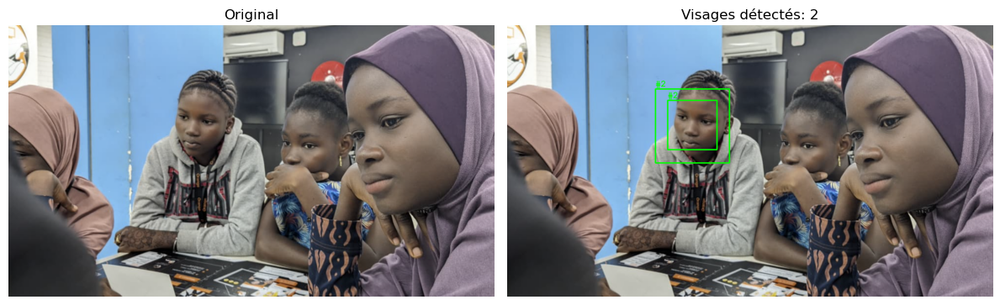

In [14]:
# Test
faces, result = detecter_visages('face.png')

In [15]:
def comparer_parametres(image_path):
    """Compare l'impact des paramètres de détection"""
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    face_cascade = cv2.CascadeClassifier(
        cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'
    )
    
    # Différents paramètres à tester
    parametres = [
        {'scaleFactor': 1.05, 'minNeighbors': 3, 'titre': 'SF=1.05, MN=3'},
        {'scaleFactor': 1.1, 'minNeighbors': 5, 'titre': 'SF=1.1, MN=5 (défaut)'},
        {'scaleFactor': 1.3, 'minNeighbors': 7, 'titre': 'SF=1.3, MN=7'},
        {'scaleFactor': 1.1, 'minNeighbors': 10, 'titre': 'SF=1.1, MN=10 (strict)'}
    ]
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    axes = axes.ravel()
    
    for i, params in enumerate(parametres):
        # Détection
        faces = face_cascade.detectMultiScale(
            gray,
            scaleFactor=params['scaleFactor'],
            minNeighbors=params['minNeighbors'],
            minSize=(30, 30)
        )
        
        # Dessiner
        img_temp = img.copy()
        for (x, y, w, h) in faces:  # ← CORRECTION ICI
            cv2.rectangle(img_temp, (x, y), (x+w, y+h), (0, 255, 0), 2)
        
        # Afficher
        axes[i].imshow(cv2.cvtColor(img_temp, cv2.COLOR_BGR2RGB))
        axes[i].set_title(f"{params['titre']}\n{len(faces)} visages")
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()



In [6]:
def comparer_parametres(image_path):
    """Compare l'impact des paramètres de détection"""

    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # Convertir en niveaux de gris (obligatoire pour Haar Cascade)
    
    # Charger le classificateur Haar pré-entraîné pour détection de visage
    face_cascade = cv2.CascadeClassifier(
        cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'
    )
    
    # Liste des jeux de paramètres à tester
    # scaleFactor = vitesse/échelle de détection
    # minNeighbors = niveau de filtrage (plus haut = plus strict)
    parametres = [
        {'scaleFactor': 1.05, 'minNeighbors': 3, 'titre': 'SF=1.05, MN=3'},
        {'scaleFactor': 1.1, 'minNeighbors': 5, 'titre': 'SF=1.1, MN=5 (défaut)'},
        {'scaleFactor': 1.3, 'minNeighbors': 7, 'titre': 'SF=1.3, MN=7'},
        {'scaleFactor': 1.1, 'minNeighbors': 10, 'titre': 'SF=1.1, MN=10 (strict)'}
    ]
    
    # Créer une grille 2 x 2 pour afficher les résultats
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    axes = axes.ravel()  # Passage sous forme de liste [0,1,2,3]
    
    # Tester chaque combinaison de paramètres
    for i, params in enumerate(parametres):
        
        # 2) Détecter les visages avec les paramètres actuels
        faces = face_cascade.detectMultiScale(
            gray,
            scaleFactor=params['scaleFactor'],
            minNeighbors=params['minNeighbors'],
            minSize=(30, 30)  # Taille minimale d'un visage
        )
        
        # 3) Dessiner les rectangles sur une copie de l'image
        img_temp = img.copy()
        for (x, y, w, h) in faces:  # Un rectangle par visage détecté
            cv2.rectangle(img_temp, (x, y), (x+w, y+h), (0, 255, 0), 2)
        
        # 4) Afficher le résultat avec un titre descriptif
        axes[i].imshow(cv2.cvtColor(img_temp, cv2.COLOR_BGR2RGB))
        axes[i].set_title(f"{params['titre']}\n{len(faces)} visages")
        axes[i].axis('off')  # Pas de graduation
        
    # Ajuster l'affichage global
    plt.tight_layout()
    plt.show()


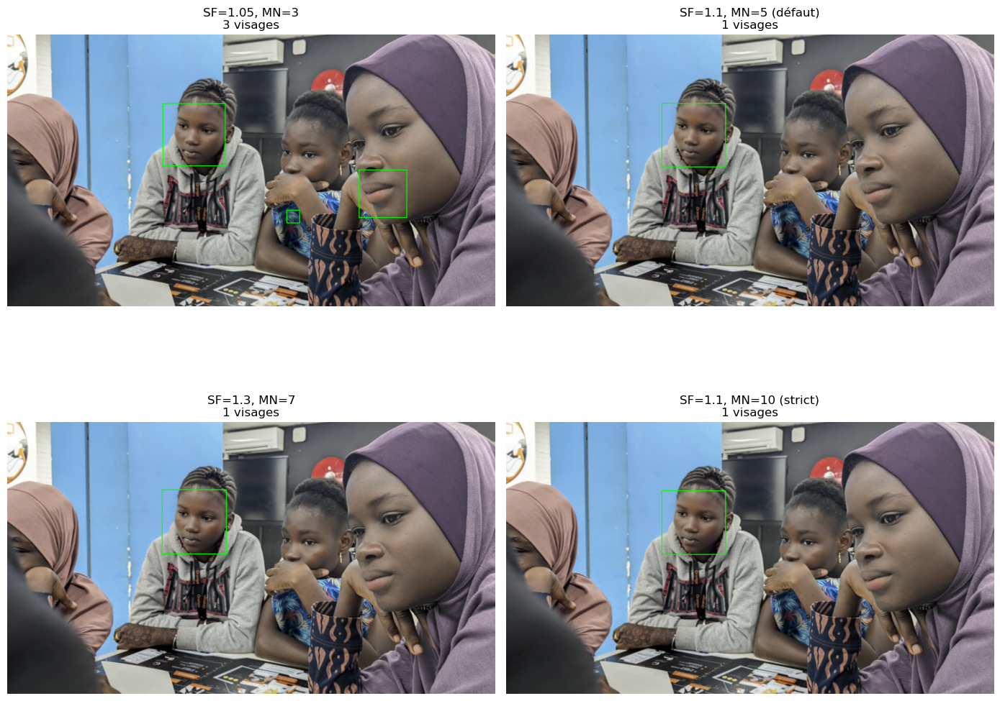

In [16]:
# Tester la comparaison de paramètres
comparer_parametres('face.png')

In [17]:
def detecter_visage_et_yeux(image_path):
    """Détecte visages et yeux dans une image"""
    img = cv2.imread(image_path)
    
    if img is None:
        print(f"Erreur: impossible de charger {image_path}")
        return None, None
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Charger les cascades
    face_cascade = cv2.CascadeClassifier(
        cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'
    )
    eye_cascade = cv2.CascadeClassifier(
        cv2.data.haarcascades + 'haarcascade_eye.xml'
    )
    
    # Détecter les visages
    faces = face_cascade.detectMultiScale(gray, 1.1, 5)
    
    img_result = img.copy()
    
    for (x, y, w, h) in faces:
        # Rectangle pour le visage (vert)
        cv2.rectangle(img_result, (x, y), (x+w, y+h), (0, 255, 0), 2)
        
        # Extraire la région du visage
        roi_gray = gray[y:y+h, x:x+w]
        roi_color = img_result[y:y+h, x:x+w]
        
        # Détecter les yeux dans le visage
        eyes = eye_cascade.detectMultiScale(roi_gray, 1.1, 10)
        
        for (ex, ey, ew, eh) in eyes:
            # Cercles pour les yeux (bleu)
            center = (x + ex + ew//2, y + ey + eh//2)
            radius = ew//2
            cv2.circle(img_result, center, radius, (255, 0, 0), 2)
        
        # Ajouter texte
        cv2.putText(img_result, f'{len(eyes)} yeux', (x, y-10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    
    # Affichage
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original')
    axes[0].axis('off')
    
    axes[1].imshow(cv2.cvtColor(img_result, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f'{len(faces)} visages détectés')
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return faces, img_result


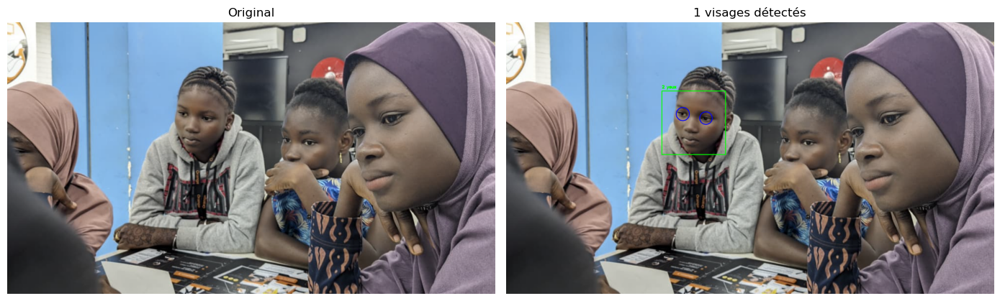

In [18]:
# Détecter visages et yeux
faces, result = detecter_visage_et_yeux('face.png')

In [19]:
def detection_webcam():
    """Détection en temps réel via webcam"""
    # Charger les cascades
    face_cascade = cv2.CascadeClassifier(
        cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'
    )
    eye_cascade = cv2.CascadeClassifier(
        cv2.data.haarcascades + 'haarcascade_eye.xml'
    )
    
    # Ouvrir la webcam
    cap = cv2.VideoCapture(0)
    
    if not cap.isOpened():
        print("Erreur: impossible d'ouvrir la webcam")
        return
    
    print("Appuyez sur 'q' pour quitter, 's' pour capturer")
    capture_count = 0
    
    while True:
        ret, frame = cap.read() # Lire une image (frame) depuis la webcam
        
        if not ret:
            print("Erreur de lecture")
            break
        
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        
        # Détection
        faces = face_cascade.detectMultiScale(gray, 1.1, 5)# Détection des visages dans l'image
        
        #  Dessiner les visages détectés
        for (x, y, w, h) in faces:
            cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 2) # Rectangle vert autour du visage
            
            # Yeux
            roi_gray = gray[y:y+h, x:x+w] # Zone d'intérêt pour détecter les yeux dans le visage seulement
            eyes = eye_cascade.detectMultiScale(roi_gray, 1.1, 10) # Détection des yeux dans la région du visage
            
            # Dessiner les yeux trouvés (cercles bleus)
            for (ex, ey, ew, eh) in eyes:
                center = (x + ex + ew//2, y + ey + eh//2)
                cv2.circle(frame, center, ew//2, (255, 0, 0), 2)
        
        # Afficher le nombre de visages
        cv2.putText(frame, f'Visages: {len(faces)}', (10, 30),
                   cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
        
        # Afficher
        cv2.imshow('Detection Temps Reel', frame)
        
         # Attendre une touche clavier (non bloquant)
        key = cv2.waitKey(1) & 0xFF
        
        if key == ord('q'):
            break
        elif key == ord('s'):
            # Capturer l'image
            filename = f'capture_{capture_count}.jpg'
            cv2.imwrite(filename, frame)
            print(f"Image sauvegardée: {filename}")
            capture_count += 1
    
    cap.release()
    cv2.destroyAllWindows()
    print(f"\nTotal captures: {capture_count}")



In [20]:
# Lancer 
detection_webcam()

Appuyez sur 'q' pour quitter, 's' pour capturer
Erreur de lecture

Total captures: 0


In [13]:
def detecter_cercles(image_path):
    """Détecte les cercles avec HoughCircles"""
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # Convertir en niveaux de gris (HoughCircles ne fonctionne pas en couleur)
    
    # Appliquer un flou médian pour réduire le bruit sans trop déformer les contours
    gray_blur = cv2.medianBlur(gray, 5)
    
    # Détection de cercles
    circles = cv2.HoughCircles(
        gray_blur,            # Image d'entrée (niveaux de gris avec flou)
        cv2.HOUGH_GRADIENT,   # Méthode de détection
        dp=1,                 # Résolution inverse de l’accumulateur (1 = même taille)
        minDist=50,           # Distance minimale entre les centres de cercles
        param1=50,            # Seuil supérieur du Canny (le seuil inférieur = 0.5*param1)
        param2=30,            # Seuil d'accumulation pour valider un cercle
        minRadius=10,         # Rayon minimum acceptable
        maxRadius=100         # Rayon maximum acceptable
    )
    
    img_result = img.copy()
    
    if circles is not None:
        # On arrondit et convertit les valeurs en entiers non signés
        circles = np.uint16(np.around(circles))
        
        # Boucle sur tous les cercles trouvés
        for i, (x, y, r) in enumerate(circles[0, :]):
            # Dessiner le contour du cercle (vert)
            cv2.circle(img_result, (x, y), r, (0, 255, 0), 3)
            # Dessiner le centre (rouge)
            cv2.circle(img_result, (x, y), 2, (0, 0, 255), 3)
            # Numéroter chaque cercle au-dessus
            cv2.putText(img_result, f'#{i+1}', (x-10, y-r-10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
        
        print(f"Nombre de cercles détectés: {len(circles[0])}")
    else:
        print("Aucun cercle détecté")
    
    # Affichage
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original')
    axes[0].axis('off')
    
    axes[1].imshow(cv2.cvtColor(img_result, cv2.COLOR_BGR2RGB))
    titre = f"Cercles détectés: {len(circles[0]) if circles is not None else 0}"
    axes[1].set_title(titre)
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return circles, img_result



/var/folders/g7/ld0lk_gx17j4f_sn4vcpx6jw0000gp/T/ipykernel_29524/2304916389.py:34: RuntimeWarning: overflow encountered in scalar subtract
  cv2.putText(img_result, f'#{i+1}', (x-10, y-r-10),


Nombre de cercles détectés: 46


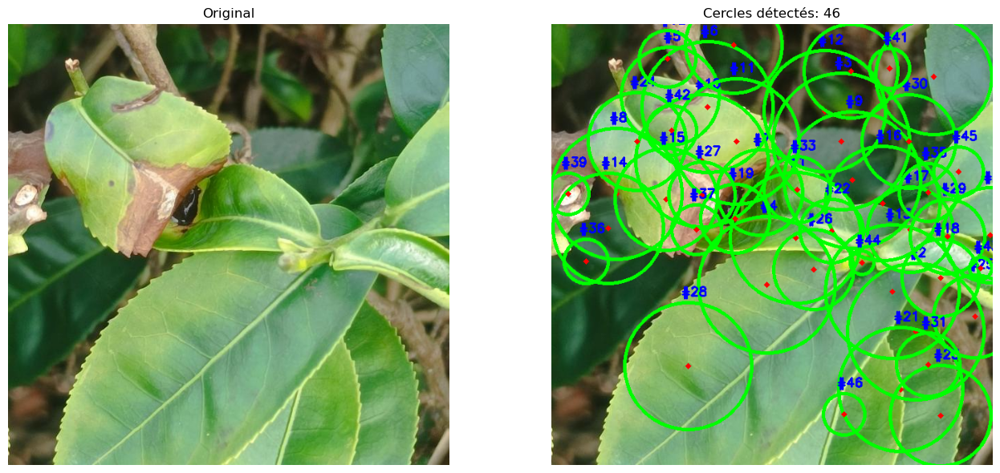

In [14]:
# Test
circles, result = detecter_cercles('im1.jpg')

In [15]:
def compter_objets(image_path, min_area=500):
    """Compte les objets dans une image"""
    img = cv2.imread(image_path)
    original = img.copy()
    
    # Prétraitement
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    
    
    # Binarisation adaptative pour séparer les objets du fond
    thresh = cv2.adaptiveThreshold(
        blur, 255,                          # Image d'entrée et valeur max (255)
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,    # Seuil local basé sur une moyenne pondérée
        cv2.THRESH_BINARY_INV,              # Objets en blanc, fond en noir
        11,                                 # Taille du voisinage pour calculer le seuil
        2                                   # Constante soustraite pour ajuster le seuil
    )

    #  Morphologie pour nettoyer l'image
    kernel = np.ones((3, 3), np.uint8)      # Kernel 3x3 pour opérations morphologiques

    # Ouverture : élimine les petits bruits blancs
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

    # Fermeture : comble les petits trous dans les objets
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel, iterations=2)

    #  Détection des contours dans l'image binaire nettoyée
    contours, hierarchy = cv2.findContours(
        closing,
        cv2.RETR_EXTERNAL,   # On ne garde que les contours externes
        cv2.CHAIN_APPROX_SIMPLE  # Simplifie les points du contour
    )

    #  Filtrage des objets par aire minimale
    objets_valides = []
    for cnt in contours:
        area = cv2.contourArea(cnt)       # Calcul de l'aire de chaque contour
        if area > min_area:               # Seuil pour ignorer les petits objets
            objets_valides.append(cnt)

    #  Dessin des contours et informations
    img_result = original.copy()          # Copier l'image originale pour dessiner
    colors = [(0, 255, 0), (255, 0, 0), (0, 0, 255), 
            (255, 255, 0), (255, 0, 255), (0, 255, 255)]  # Couleurs pour chaque objet

    for i, cnt in enumerate(objets_valides):
        # Choisir une couleur cyclique
        color = colors[i % len(colors)]
        
        # Dessiner le contour
        cv2.drawContours(img_result, [cnt], -1, color, 2)
        
        # Calcul du centre du contour
        M = cv2.moments(cnt)
        if M['m00'] != 0:  # Éviter division par zéro
            cx = int(M['m10'] / M['m00'])
            cy = int(M['m01'] / M['m00'])
            
            # Dessiner le centre du contour
            cv2.circle(img_result, (cx, cy), 5, color, -1)
            
            # Ajouter le numéro de l'objet
            cv2.putText(img_result, f'#{i+1}', (cx-15, cy-15),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)
            
            # Afficher l'aire de l'objet à côté
            area = cv2.contourArea(cnt)
            cv2.putText(img_result, f'{int(area)}px', (cx-20, cy+20),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.4, color, 1)

    
    # Affichage
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    
    axes[0, 0].imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    axes[0, 0].set_title('Original')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(thresh, cmap='gray')
    axes[0, 1].set_title('Binarisation')
    axes[0, 1].axis('off')
    
    axes[1, 0].imshow(closing, cmap='gray')
    axes[1, 0].set_title('Après morphologie')
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(cv2.cvtColor(img_result, cv2.COLOR_BGR2RGB))
    axes[1, 1].set_title(f'Objets comptés: {len(objets_valides)}')
    axes[1, 1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"\n=== RÉSULTATS ===")
    print(f"Objets détectés: {len(objets_valides)}")
    for i, cnt in enumerate(objets_valides):
        area = cv2.contourArea(cnt)
        perimeter = cv2.arcLength(cnt, True)
        print(f"  Objet #{i+1}: Aire={int(area)}px², Périmètre={int(perimeter)}px")
    
    return objets_valides, img_result



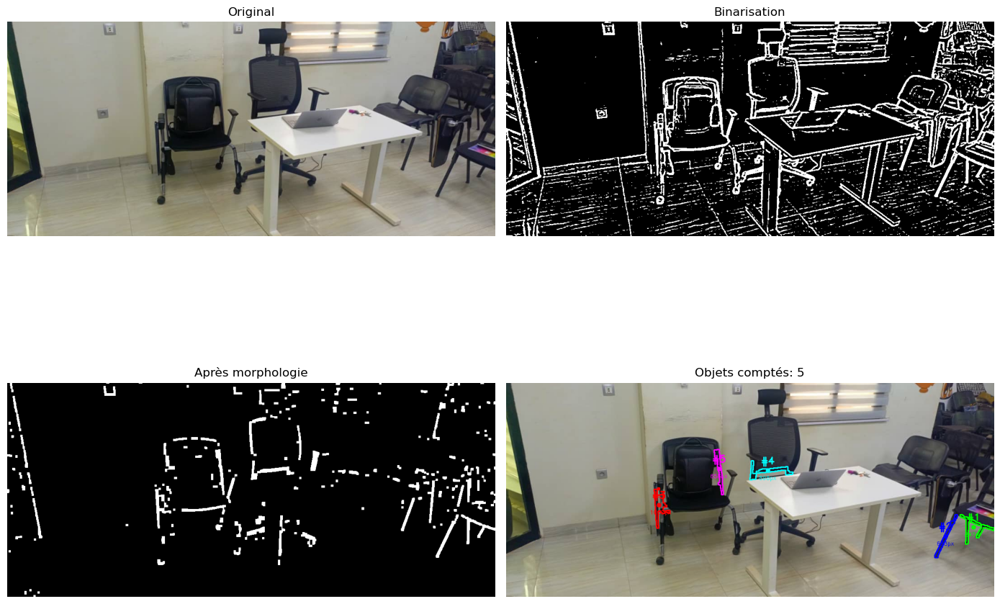


=== RÉSULTATS ===
Objets détectés: 5
  Objet #1: Aire=847px², Périmètre=343px
  Objet #2: Aire=633px², Périmètre=242px
  Objet #3: Aire=1060px², Périmètre=279px
  Objet #4: Aire=898px², Périmètre=309px
  Objet #5: Aire=658px², Périmètre=232px


In [16]:
# Test
objets, result = compter_objets('obj.jpg', min_area=600)

In [17]:
# Variables globales pour stocker l'état
historique = []
stats = {
    'total_images': 0,
    'total_objets': 0,
    'moyenne_objets': 0
}

def analyser_image(image_path, min_area=500, afficher=True):
    """Analyse une image et met à jour les statistiques globales"""
    global historique, stats

    img = cv2.imread(image_path)
    if img is None:
        print(f"Erreur: impossible de charger {image_path}")
        return None
    
    # Prétraitement
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Binarisation
    thresh = cv2.adaptiveThreshold(
        blur, 255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV,
        11, 2
    )
    
    # Nettoyage morphologique
    kernel = np.ones((3, 3), np.uint8)
    cleaned = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
    cleaned = cv2.morphologyEx(cleaned, cv2.MORPH_CLOSE, kernel, iterations=2)
    
    # Détection des contours
    contours, _ = cv2.findContours(
        cleaned,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )
    
    # Filtrer par taille minimale
    objets = [cnt for cnt in contours if cv2.contourArea(cnt) > min_area]
    
    # Mise à jour des statistiques
    stats['total_images'] += 1
    stats['total_objets'] += len(objets)
    stats['moyenne_objets'] = stats['total_objets'] / stats['total_images']
    
    # Sauvegarde des résultats
    resultat = {
        'image': image_path,
        'nombre_objets': len(objets),
        'contours': objets
    }
    historique.append(resultat)
    
    # Dessin des contours
    img_result = img.copy()
    for i, cnt in enumerate(objets):
        cv2.drawContours(img_result, [cnt], -1, (0, 255, 0), 2)
        M = cv2.moments(cnt)
        if M['m00'] != 0:
            cx = int(M['m10'] / M['m00'])
            cy = int(M['m01'] / M['m00'])
            cv2.putText(img_result, f'#{i+1}', (cx-10, cy),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
    
    # Affichage
    if afficher:
        fig, axes = plt.subplots(1, 2, figsize=(14, 6))
        axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axes[0].set_title('Original')
        axes[0].axis('off')

        axes[1].imshow(cv2.cvtColor(img_result, cv2.COLOR_BGR2RGB))
        axes[1].set_title(f'Objets détectés: {len(objets)}')
        axes[1].axis('off')

        plt.tight_layout()
        plt.show()
    
    return resultat




In [18]:
def afficher_statistiques():
    """Affiche les statistiques globales"""
    print("\n" + "="*50)
    print("STATISTIQUES GLOBALES")
    print("="*50)
    print(f"Images analysées: {stats['total_images']}")
    print(f"Objets totaux: {stats['total_objets']}")
    print(f"Moyenne par image: {stats['moyenne_objets']:.2f}")
    print("\nDétail par image:")
    print("-"*50)
    
    for i, result in enumerate(historique):
        print(f"  {i+1}. {result['image']}: {result['nombre_objets']} objets")
    
    print("="*50)

def creer_rapport_visuel():
    """Crée un rapport visuel de toutes les analyses"""
    if not historique:
        print("Aucune image analysée")
        return
    
    n_images = len(historique)
    cols = 3
    rows = (n_images + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5*rows))
    if rows == 1:
        axes = np.array([axes])
    axes = axes.ravel()
    
    for i, result in enumerate(historique):
        img = cv2.imread(result['image'])
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        for cnt in result['contours']:
            cv2.drawContours(img_rgb, [cnt], -1, (0, 255, 0), 2)
        
        axes[i].imshow(img_rgb)
        axes[i].set_title(f"{result['image']}\n{result['nombre_objets']} objets")
        axes[i].axis('off')
    
    for i in range(n_images, len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()



Analyse de im1.jpg...


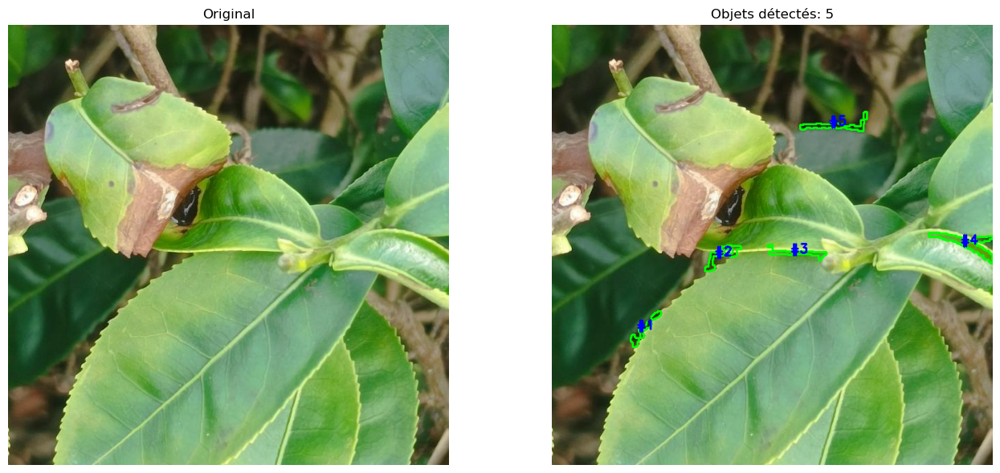


Analyse de face.png...


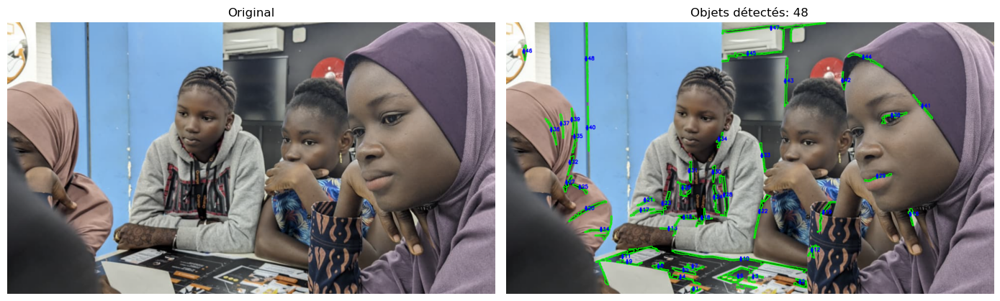


Analyse de im2.jpg...
Erreur: impossible de charger im2.jpg

STATISTIQUES GLOBALES
Images analysées: 2
Objets totaux: 53
Moyenne par image: 26.50

Détail par image:
--------------------------------------------------
  1. im1.jpg: 5 objets
  2. face.png: 48 objets


[ WARN:0@333.195] global loadsave.cpp:248 findDecoder imread_('im2.jpg'): can't open/read file: check file path/integrity


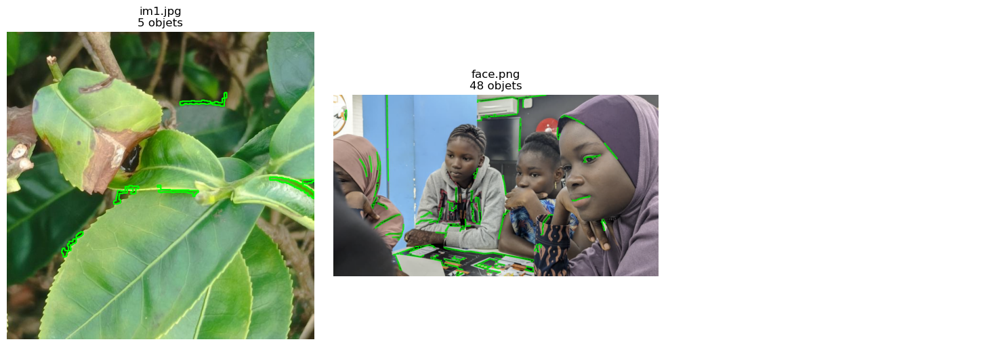

In [19]:
# UTILISATION
images = ['im1.jpg', 'face.png', 'im2.jpg']

for img_path in images:
    print(f"\nAnalyse de {img_path}...")
    analyser_image(img_path, min_area=400)

afficher_statistiques()
creer_rapport_visuel()

In [21]:
class CompteurIntelligent:
    """Système de comptage avec historique et statistiques"""
    
    def __init__(self):
        self.historique = []
        self.stats = {
            'total_images': 0,
            'total_objets': 0,
            'moyenne_objets': 0
        }
    
    def analyser_image(self, image_path, min_area=500, afficher=True):
        """Analyse une image et met à jour les stats"""
        img = cv2.imread(image_path)
        if img is None:
            print(f"Erreur: impossible de charger {image_path}")
            return None
        
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        blur = cv2.GaussianBlur(gray, (5, 5), 0)
        
        # Binarisation
        thresh = cv2.adaptiveThreshold(
            blur, 255,
            cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
            cv2.THRESH_BINARY_INV,
            11, 2
        )
        
        # Morphologie
        kernel = np.ones((3, 3), np.uint8)
        cleaned = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
        cleaned = cv2.morphologyEx(cleaned, cv2.MORPH_CLOSE, kernel, iterations=2)
        
        # Contours
        contours, _ = cv2.findContours(
            cleaned,
            cv2.RETR_EXTERNAL,
            cv2.CHAIN_APPROX_SIMPLE
        )
        
        # Filtrer
        objets = [cnt for cnt in contours if cv2.contourArea(cnt) > min_area]
        
        # Mettre à jour stats
        self.stats['total_images'] += 1
        self.stats['total_objets'] += len(objets)
        self.stats['moyenne_objets'] = self.stats['total_objets'] / self.stats['total_images']
        
        # Historique
        resultat = {
            'image': image_path,
            'nombre_objets': len(objets),
            'contours': objets
        }
        self.historique.append(resultat)
        
        # Dessiner
        img_result = img.copy()
        for i, cnt in enumerate(objets):
            cv2.drawContours(img_result, [cnt], -1, (0, 255, 0), 2)
            M = cv2.moments(cnt)
            if M['m00'] != 0:
                cx = int(M['m10'] / M['m00'])
                cy = int(M['m01'] / M['m00'])
                cv2.putText(img_result, f'#{i+1}', (cx-10, cy),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
        
        # Afficher
        if afficher:
            fig, axes = plt.subplots(1, 2, figsize=(14, 6))
            
            axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            axes[0].set_title('Original')
            axes[0].axis('off')
            
            axes[1].imshow(cv2.cvtColor(img_result, cv2.COLOR_BGR2RGB))
            axes[1].set_title(f'Objets: {len(objets)}')
            axes[1].axis('off')
            
            plt.tight_layout()
            plt.show()
        
        return resultat
    
    def afficher_statistiques(self):
        """Affiche les statistiques globales"""
        print("\n" + "="*50)
        print("STATISTIQUES GLOBALES")
        print("="*50)
        print(f"Images analysées: {self.stats['total_images']}")
        print(f"Objets totaux: {self.stats['total_objets']}")
        print(f"Moyenne par image: {self.stats['moyenne_objets']:.2f}")
        print("\nDétail par image:")
        print("-"*50)
        
        for i, result in enumerate(self.historique):
            print(f"  {i+1}. {result['image']}: {result['nombre_objets']} objets")
        
        print("="*50)
    
    def creer_rapport_visuel(self):
        """Crée un rapport visuel de toutes les analyses"""
        if not self.historique:
            print("Aucune image analysée")
            return
        
        n_images = len(self.historique)
        cols = 3
        rows = (n_images + cols - 1) // cols
        
        fig, axes = plt.subplots(rows, cols, figsize=(15, 5*rows))
        if rows == 1:
            axes = axes.reshape(1, -1)
        axes = axes.ravel()
        
        for i, result in enumerate(self.historique):
            img = cv2.imread(result['image'])
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            # Dessiner les contours
            for cnt in result['contours']:
                cv2.drawContours(img_rgb, [cnt], -1, (0, 255, 0), 2)
            
            axes[i].imshow(img_rgb)
            axes[i].set_title(f"{result['image']}\n{result['nombre_objets']} objets")
            axes[i].axis('off')
        
        # Masquer les axes vides
        for i in range(n_images, len(axes)):
            axes[i].axis('off')
        
        plt.tight_layout()
        plt.show()



Analyse de im1.jpg...


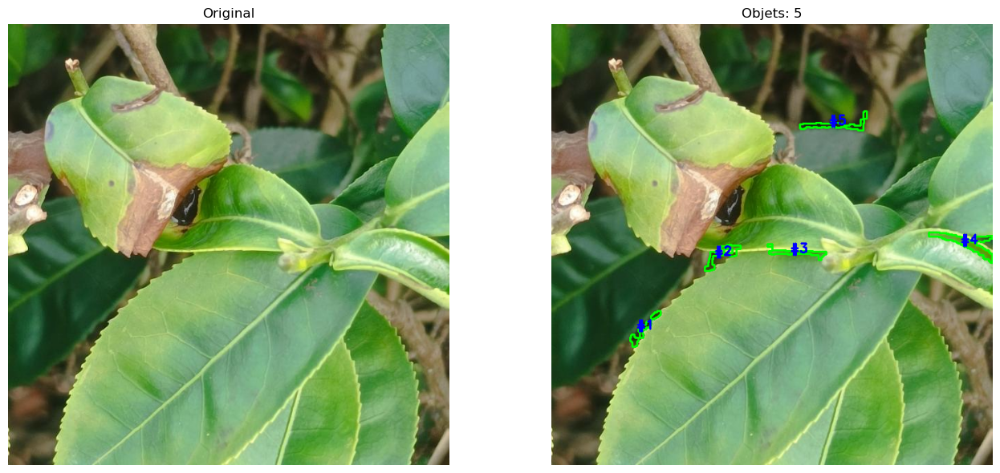


Analyse de face.png...


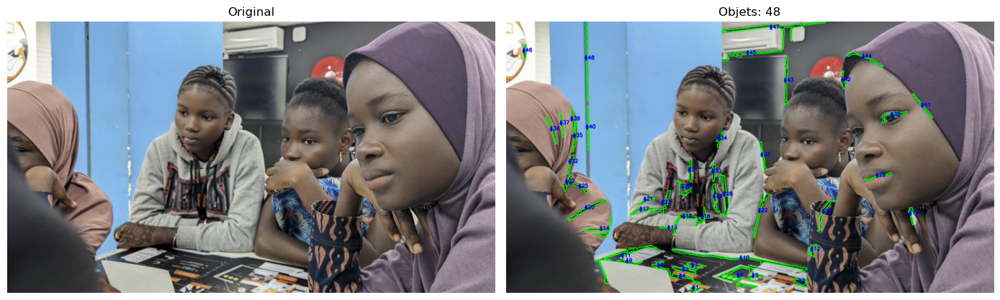


Analyse de im2.jpg...
Erreur: impossible de charger im2.jpg

STATISTIQUES GLOBALES
Images analysées: 2
Objets totaux: 53
Moyenne par image: 26.50

Détail par image:
--------------------------------------------------
  1. im1.jpg: 5 objets
  2. face.png: 48 objets


[ WARN:0@368.760] global loadsave.cpp:248 findDecoder imread_('im2.jpg'): can't open/read file: check file path/integrity


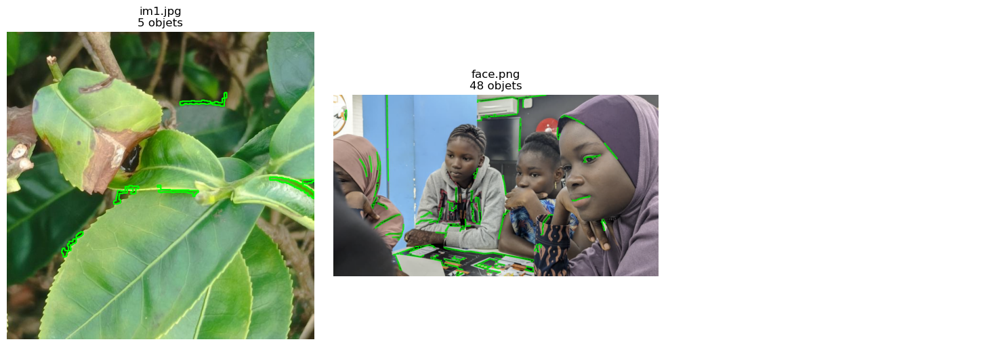

In [22]:
# UTILISATION COMPLÈTE
compteur = CompteurIntelligent()

# Analyser plusieurs images
images = ['im1.jpg', 'face.png', 'im2.jpg']

for img_path in images:
    print(f"\nAnalyse de {img_path}...")
    compteur.analyser_image(img_path, min_area=400)

# Statistiques
compteur.afficher_statistiques()

# Rapport visuel
compteur.creer_rapport_visuel()

In [22]:
class SystemeSecurite:
    """Système de surveillance basique"""
    
    def __init__(self, max_personnes=5, activer_alertes=True):
        self.max_personnes = max_personnes
        self.activer_alertes = activer_alertes
        self.rapports = []
        
        # Charger les cascades
        self.face_cascade = cv2.CascadeClassifier(
            cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'
        )
        self.smile_cascade = cv2.CascadeClassifier(
            cv2.data.haarcascades + 'haarcascade_smile.xml'
        )
    
    def analyser_scene(self, image_path):
        """Analyse une scène pour détecter les personnes"""
        img = cv2.imread(image_path)
        if img is None:
            return None
        
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # Détecter visages
        faces = self.face_cascade.detectMultiScale(gray, 1.1, 5)
        
        nb_visages = len(faces)
        nb_sourires = 0
        img_result = img.copy()
        
        # Analyser chaque visage
        for i, (x, y, w, h) in enumerate(faces):
            # Rectangle
            color = (0, 255, 0) if nb_visages <= self.max_personnes else (0, 0, 255)
            cv2.rectangle(img_result, (x, y), (x+w, y+h), color, 3)
            
            # Détecter sourire
            roi_gray = gray[y:y+h, x:x+w]
            roi_smile = roi_gray[h//2:, :]
            smiles = self.smile_cascade.detectMultiScale(roi_smile, 1.8, 20)
            
            if len(smiles) > 0:
                nb_sourires += 1
                cv2.putText(img_result, 'SMILE', (x, y-10),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 255), 2)
            
            # Numéro
            cv2.putText(img_result, f'P{i+1}', (x+5, y+25),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)
        
        # Alerte
        alerte = nb_visages > self.max_personnes
        
        # Texte d'information
        info_text = f"Personnes: {nb_visages} | Sourires: {nb_sourires}"
        cv2.putText(img_result, info_text, (10, 30),
                   cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
        
        if alerte and self.activer_alertes:
            alert_text = f"ALERTE: Capacite depassee ({nb_visages}/{self.max_personnes})"
            cv2.putText(img_result, alert_text, (10, 70),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 2, cv2.LINE_AA)
        
        # Rapport
        rapport = {
            'image': image_path,
            'nb_personnes': nb_visages,
            'nb_sourires': nb_sourires,
            'alerte': alerte,
            'timestamp': pd.Timestamp.now() if 'pd' in dir() else 'N/A'
        }
        self.rapports.append(rapport)
        
        # Affichage
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        
        axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axes[0].set_title('Original')
        axes[0].axis('off')
        
        axes[1].imshow(cv2.cvtColor(img_result, cv2.COLOR_BGR2RGB))
        titre = f"Analyse: {nb_visages} personnes"
        if alerte:
            titre += " - ALERTE"
        axes[1].set_title(titre, color='red' if alerte else 'green', fontsize=14, weight='bold')
        axes[1].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        # Logs
        print(f"\n{'='*60}")
        print(f"RAPPORT D'ANALYSE: {image_path}")
        print(f"{'='*60}")
        print(f"Personnes détectées: {nb_visages}")
        print(f"Sourires détectés: {nb_sourires}")
        print(f"Capacité maximale: {self.max_personnes}")
        print(f"Statut: {'ALERTE' if alerte else 'OK'}")
        print(f"{'='*60}\n")
        
        return rapport
    
    def generer_rapport_complet(self):
        """Génère un rapport complet de toutes les analyses"""
        if not self.rapports:
            print("Aucune analyse effectuée")
            return
        
        print("\n" + "="*60)
        print("RAPPORT COMPLET DU SYSTÈME DE SÉCURITÉ")
        print("="*60)
        
        total_analyses = len(self.rapports)
        total_personnes = sum(r['nb_personnes'] for r in self.rapports)
        total_alertes = sum(1 for r in self.rapports if r['alerte'])
        
        print(f"\nAnalyses effectuées: {total_analyses}")
        print(f"Personnes totales détectées: {total_personnes}")
        print(f"Moyenne par scène: {total_personnes/total_analyses:.1f}")
        print(f"Alertes déclenchées: {total_alertes}")
        
        print("\n" + "-"*60)
        print("Détail par image:")
        print("-"*60)
        
        for i, rapport in enumerate(self.rapports):
            status = "ALERTE" if rapport['alerte'] else "OK"
            print(f"{i+1}. {rapport['image']}")
            print(f"   Personnes: {rapport['nb_personnes']} | Sourires: {rapport['nb_sourires']} | Status: {status}")
        
        print("="*60 + "\n")



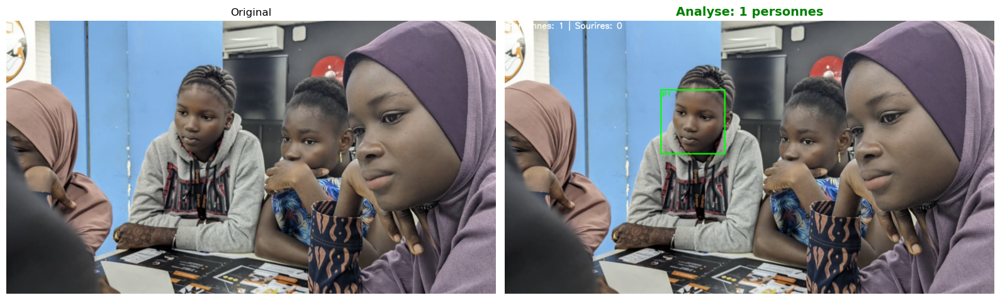


RAPPORT D'ANALYSE: face.png
Personnes détectées: 1
Sourires détectés: 0
Capacité maximale: 3
Statut: OK



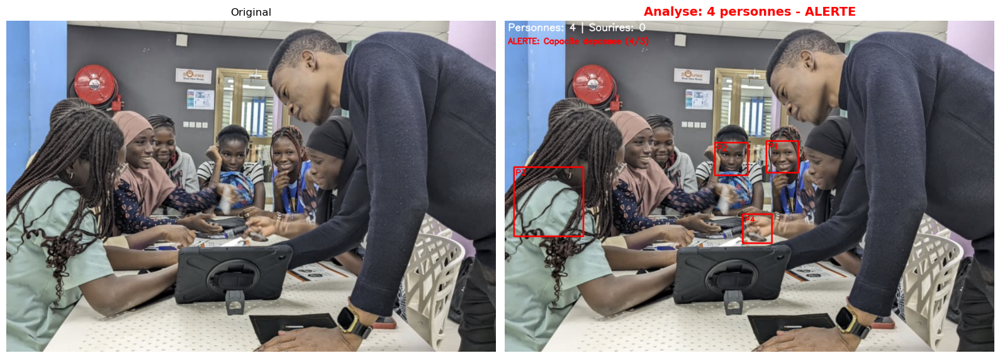


RAPPORT D'ANALYSE: foul.png
Personnes détectées: 4
Sourires détectés: 0
Capacité maximale: 3
Statut: ALERTE



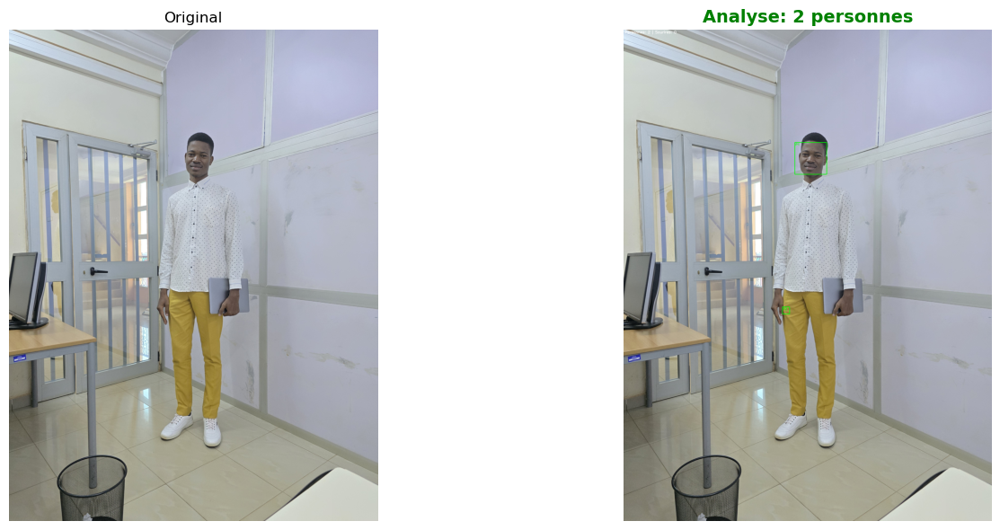


RAPPORT D'ANALYSE: pers.jpg
Personnes détectées: 2
Sourires détectés: 0
Capacité maximale: 3
Statut: OK


RAPPORT COMPLET DU SYSTÈME DE SÉCURITÉ

Analyses effectuées: 3
Personnes totales détectées: 7
Moyenne par scène: 2.3
Alertes déclenchées: 1

------------------------------------------------------------
Détail par image:
------------------------------------------------------------
1. face.png
   Personnes: 1 | Sourires: 0 | Status: OK
2. foul.png
   Personnes: 4 | Sourires: 0 | Status: ALERTE
3. pers.jpg
   Personnes: 2 | Sourires: 0 | Status: OK



In [23]:
# UTILISATION
systeme = SystemeSecurite(max_personnes=3, activer_alertes=True)

# Analyser plusieurs scènes
scenes = ['face.png', 'foul.png', 'pers.jpg']

for scene in scenes:
    systeme.analyser_scene(scene)

# Rapport final
systeme.generer_rapport_complet()